# XGBoost to predict discharge disability
### Using 7 features, with the first k-fold cross validation, using the model trained in notebook 040: a multiclass classification model to give the probability (likelihood) that each patient is in each discharge disability class (mRS 0, 1, 2, 3, 4, 5 or 6)

Use model as trained in previous notebook 040, and the SHAP values as calculated from that model in notebook 041.

Look at the global patterns that the model has detected, for the fist kfold

Notebook 051 contains some visual representations of the global SHAP patterns, such as:

 * stacked bar (using ```shap.summary_plot()``` for all of the classes)
 * beeswarm (using ```shap.summary_plot()``` for a specific class)

These plots will not be repeated here.

### Plain English summary

Let's look at the performance of a model trained on 7 features (as informed from the feature selection) for the first k-fold splis. Here we will look at the type of SHAP plots available when lokoing at the global picture (all on the instances). We will use data from the first kfold.

### Model and data
XGBoost\
7 features\
First kfold

### Aims
Look at the global patterns using SHAP for the instances in the first kfold split.

### Observations


#### Further work
How does the probability for the multiclass levels change across the mRS classes? Is it consitently incresing and decreasing up to and away from the predicted class?

#### Resources
Using code from https://github.com/samuel-book/samuel_shap_paper_1/blob/main/xgb_10_features/02b_xgb_combined_fit_accuracy_key_features_separate_k_fold.ipynb

and https://github.com/samuel-book/samuel_shap_paper_1/blob/main/xgb_10_features/03_xgb_combined_shap_key_features.ipynb

(code orignially from 01a_xgb_kfold_all_features_accuracy_importance_shap.ipynb and 01_xgb_5fold_all_features_accuracy_importance_shap.ipynb)

## Import libraries

In [1]:
# Turn warnings off to keep notebook tidy
import warnings
warnings.filterwarnings("ignore")

import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from sklearn.metrics import auc

from dataclasses import dataclass

from sklearn.metrics import roc_auc_score

import pickle
import shap

from os.path import exists

import math

import time
import datetime

Report the time duration to run notebook

In [2]:
start_time = time.time()

Choose number of kfolds (either =1 for the first kfold, or =5 for the full 5 kfold split)

In [3]:
k = 0

Select the features for the model

In [4]:
selected_features = ["prior_disability", "stroke_severity", "stroke_team", "age", 
                     "onset_to_thrombolysis_time", "any_afib_diagnosis", 
                     "precise_onset_known"]
n_features = len(selected_features)
selected_features.append('discharge_disability')

## Set up paths and filenames

Use os.path.join() to create filenames. So define folders without trailing forward slash, and include all characters in file names.

In [5]:
@dataclass(frozen=True)
class Paths:
    '''Singleton object for storing paths to data and database.'''
    image_save_path: str = './saved_images'
    model_save_path: str = './saved_models'
    data_save_path: str = './saved_data'
    data_read_path: str = '../data_processing/output/kfold_5fold'
    model_text: str = f'xgb_7_features_1fold'
    notebook: str = '053_'

paths = Paths()

Create output folders if needed

In [6]:
path = paths.image_save_path
if not os.path.exists(path):
    os.makedirs(path)
        
path = paths.model_save_path
if not os.path.exists(path):
    os.makedirs(path)

path = paths.data_save_path
if not os.path.exists(path):
    os.makedirs(path)

## Import data

Data has previously been split into 5 stratified k-fold splits.

Import data and select the features for this model.

In [7]:
# Read in training set, restrict to chosen features & store
filename = os.path.join(paths.data_read_path, 
                        ('03_train_' + str(k) + '.csv'))
train = pd.read_csv(filename)
train = train[selected_features]

filename = os.path.join(paths.data_read_path, 
                        ('03_test_' + str(k) + '.csv'))
test = pd.read_csv(filename)
test = test[selected_features]

Store the output classes

In [8]:
class_names = train['discharge_disability'].unique()
class_names = np.sort(class_names)
n_classes = len(class_names)

Take copy of stroke team to use to create a histogram (before this feature is converted into a one hot encoded feature)

In [9]:
test_stroke_team = test["stroke_team"]

### One hot the categorical features

Convert some categorical features to one hot encoded features.

Define a function

In [10]:
def convert_feature_to_one_hot(df, feature_name, prefix):
    """
    Converts a categorical feature into a one hot encoded feature
    
    Args:
        df [dataframe]: training or test dataset
        feature_name [str]: feature to convert to one hot encoding
        prefix [str]: string to use on new feature

    Return:
        df [dataframe]: One hot encoded representation of the feature
    """

    # One hot encode a feature
    df_feature = pd.get_dummies(
        df[feature_name], prefix = prefix)
    df = pd.concat([df, df_feature], axis=1)
    df.drop(feature_name, axis=1, inplace=True)

    return(df)

Set up two lists for the one hot encoding. 

A list of the feature names that are categorical and to be converted using one hot encoding.
A list of the prefixes to use for these features.

In [11]:
features_to_one_hot = ["stroke_team", "weekday"]
list_prefix = ["team", "weekday"]

For each feature in the list, for each train and test dataset, convert to one hot encoded.

In [12]:
for feature, prefix in zip(features_to_one_hot, list_prefix):
    if feature in selected_features:
        train = convert_feature_to_one_hot(train, feature, prefix))
        test = convert_feature_to_one_hot(test, feature, prefix)

Feature names with one hot encoding

In [13]:
feature_names_ohe = list(train)
feature_names_ohe.remove("discharge_disability")
n_features = len(feature_names_ohe)

In [14]:
print(f"There are {len(selected_features)} original features "
      f"(before one-hot encoding)")
print(f"There are {n_features} features (after one-hot encoding)")

There are 8 original features (before one-hot encoding)
There are 124 features (after one-hot encoding)


## Load XGBoost model

Load the model from notebook 040 that was trained on 7 features. Load the SHAP values for this model from notebook 041.

Create function to return X and y data for train and test sets

In [15]:
def get_x_y_data(train, test, target):
    """
    Pass data from the split and return the dataframes with the target in one 
    dataframe (X), and dependent features in another (y)
    
    Args:
        train [dataframe]: dataframe containing training instances 
        test [dataframe]: dataframe containing test instances
        target [string]: column name of the targert feature (the column to 
                         separate from the two dataframes)

    Return:
        X_train [dataframe]: dataframe containing input features for the 
                            training instances 
        X_test [dataframe]: dataframe containing input features for the test
                            instances 
        y_train [dataframe]: dataframe containing target feature for the 
                            training instances 
        y_test [dataframe]: dataframe containing target feature for the test
                            instances 
    """   

    # Get X and y
    X_train = train.drop(target, axis=1)
    X_test = test.drop(target, axis=1)
    y_train = train[target]
    y_test = test[target]

    return(X_train, X_test, y_train, y_test)

Create function to load XGBoost model

In [ ]:
def load_xgboost_model(filename):
    """
    Given the filename, either load if the model exists (saved as a pickle), 
    else return that user needs to run notebook 040 to create the model.

    Arg:
        filename [string]: where xgboost model is saved

    Return:
        model [model object]: xgboost classification model 
    """
    # Check if exists
    file_exists = exists(filename)

    if file_exists:
    # Load models
        with open(filename, 'rb') as filehandler:
            model = pickle.load(filehandler)
    else:
        print('Run notebook 040 first. Using the model that was trained there')
            
    return(model)

Create function to load SHAP values extension X and y data for train and test sets

In [16]:
def load_shap_extended(filename):
    """
    Load from pickle (if file exists), or notify to run notebook 011.

    Arg:
        filename [string]: path and name of file

    Return:
        shap_values_extended [dictionary]: the extended shap values (contains 
                    .values, .base, and .data) 
        
    """
    # Check if exists
    file_exists = exists(filename)

    if file_exists:
        # Load extended SHAP values
        with open(filename, 'rb') as filehandler:
            shap_values_extended = pickle.load(filehandler)
    else:
        # Calculate SHAP values
        print('Run notebook 041 first. SHAP values were calculated there')
        
    return(shap_values_extended)

In [17]:
# Get k fold split
(X_train, X_test, y_train, y_test) = get_x_y_data(train,
                                                  test,
                                                 'discharge_disability')

# Model filename
filename = os.path.join(paths.model_save_path, 
                     ('040_xgb_7_features_5fold_0.p'))

# Load model
model = load_xgboost_model(filename)

classes = model.classes_

# Get and store predicted probabilities
y_probs = model.predict_proba(X_test)

# Get and store predicted class
y_pred = model.predict(X_test)

# Calculate ROC AUC for multiclass models, using One vs Rest
roc_auc_ovr = roc_auc_score(y_test, y_probs, labels = classes, 
                            multi_class = 'ovr', average = 'macro')

# Calculate error
y_error = y_test - y_pred
accuracy = np.mean(y_error==0)

error_within_one = np.mean(np.abs(y_error)<=1)

# Get and store feature importances
feature_importance = model.feature_importances_

# Set filename
filename = os.path.join(paths.data_save_path, 
                     ('041_' + paths.model_text + 
                            '_shap_values_extended_' + str(k) + '.p'))
# Get and store SHAP values
shap_values_extended = load_shap_extended(filename)
shap_values = shap_values_extended.values()

print (f'7 features, accuracy: {accuracy:0.3f}')
print (f'7 features, accuracy within one: {error_within_one:0.3f}')

Completed 1 of 5
Completed 2 of 5
Completed 3 of 5
Completed 4 of 5
Completed 5 of 5
All features, accuracy: 0.429 (std across 5 kfolds: 0.001)
All features, accuracy within one: 0.746 (std across 5 kfolds: 0.002)


A SHAP value is returned for each feature, for each instance, for each of the 7 output classes. It represents the contribution on the models prediction.

We will use the shap library: https://shap.readthedocs.io/en/latest/index.html

'Raw' SHAP values from XGBoost model are log odds ratios. A SHAP value is returned for each feature, for each instance, for each model (one per k-fold)

In notebook 041 we looked at two versions of the summary SHAP plot for each kfold:

* stacked bar (using ```shap.summary_plot()``` for all of the classes): One plot per kfold, the contribution (in terms of mean absolute SHAP) of a feature to each class output.
* beeswarm (using ```shap.summary_plot()``` for a specific class): One plot per kfold and class, the contribution of a feature value to that class output.

Here we will delve a little deeper.

We've looked at the level of contribution each feature has on determining if a patient has a specific disability at discharge. Here we use dependence plots to look at patterns between the features (feature values and SHAP values) for each output class.

Each subplot contains a matrix of these features, showing the relationship between the SHAP value and feature value of one feature, while displaying the feature values of another feature. Each figure contains information for each output class - so we can observe how these patterns change depending on which output class are predicting.

We create a matrix of dependence plots (a plot per feature), and so we need to limit the number of features that we can include so that the visualisation is understandable.

We will include four features (informed by the importance results above): prior disability, age, stroke severity and onset to thrombolysis time.

This is to show an example of the type of visualisation that we can use to understand patterns that the model has identified. This is for the first kfold.

Resources used:
* reduce the dot size/transparancy to reveal dense vs sparse areas
https://slundberg.github.io/shap/notebooks/plots/dependence_plot.html
Option to pass the argument "dot_size".

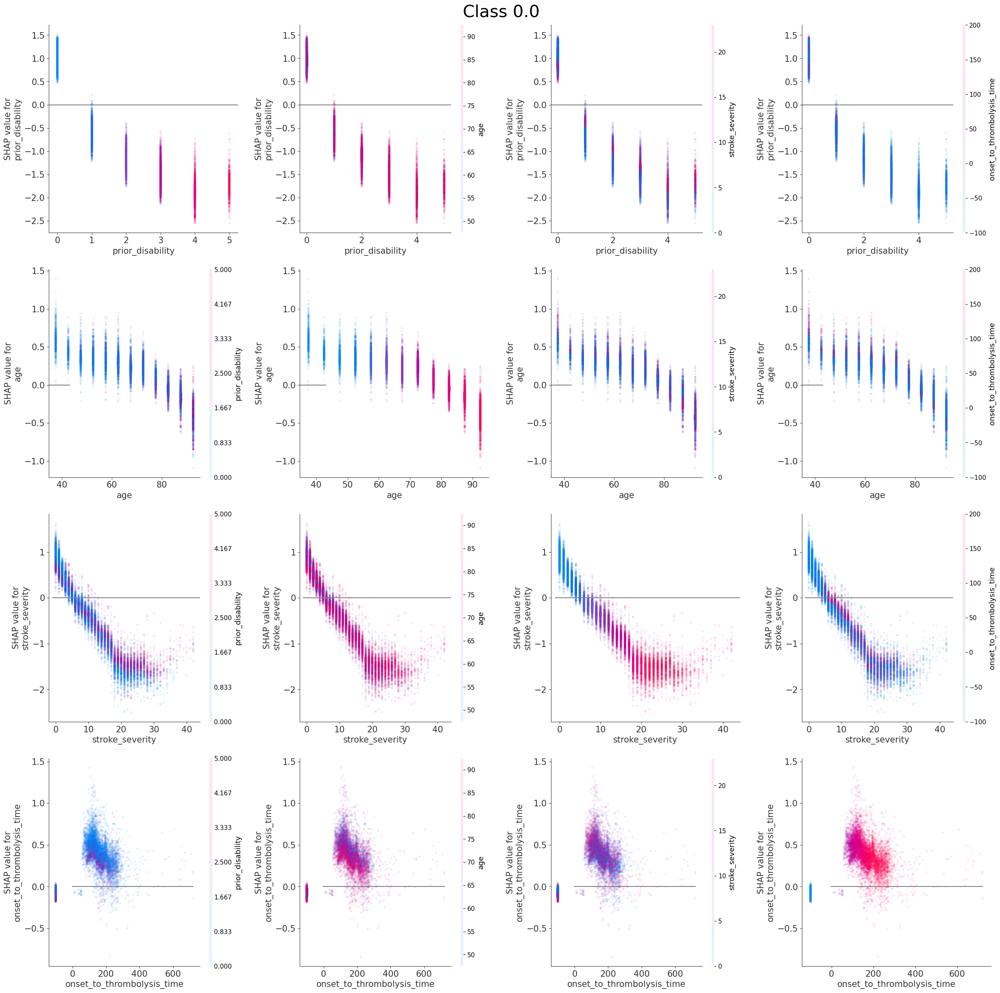

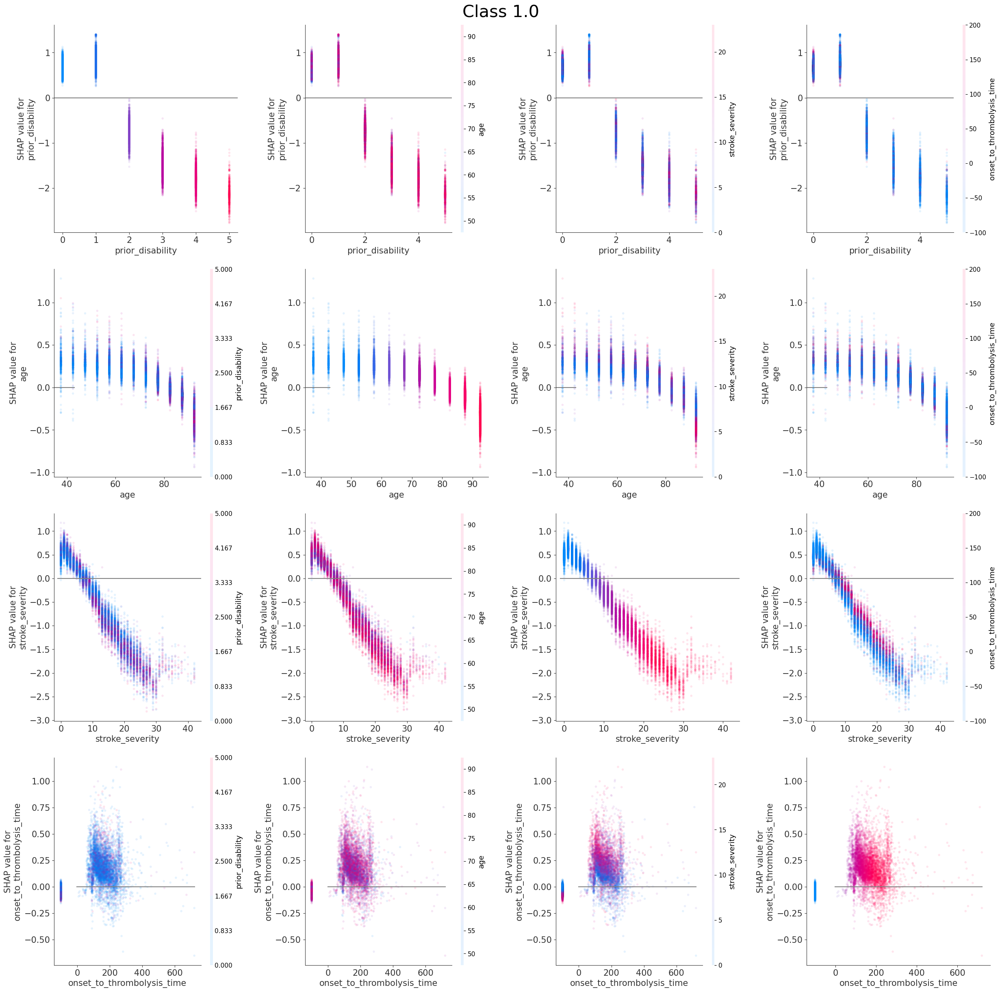

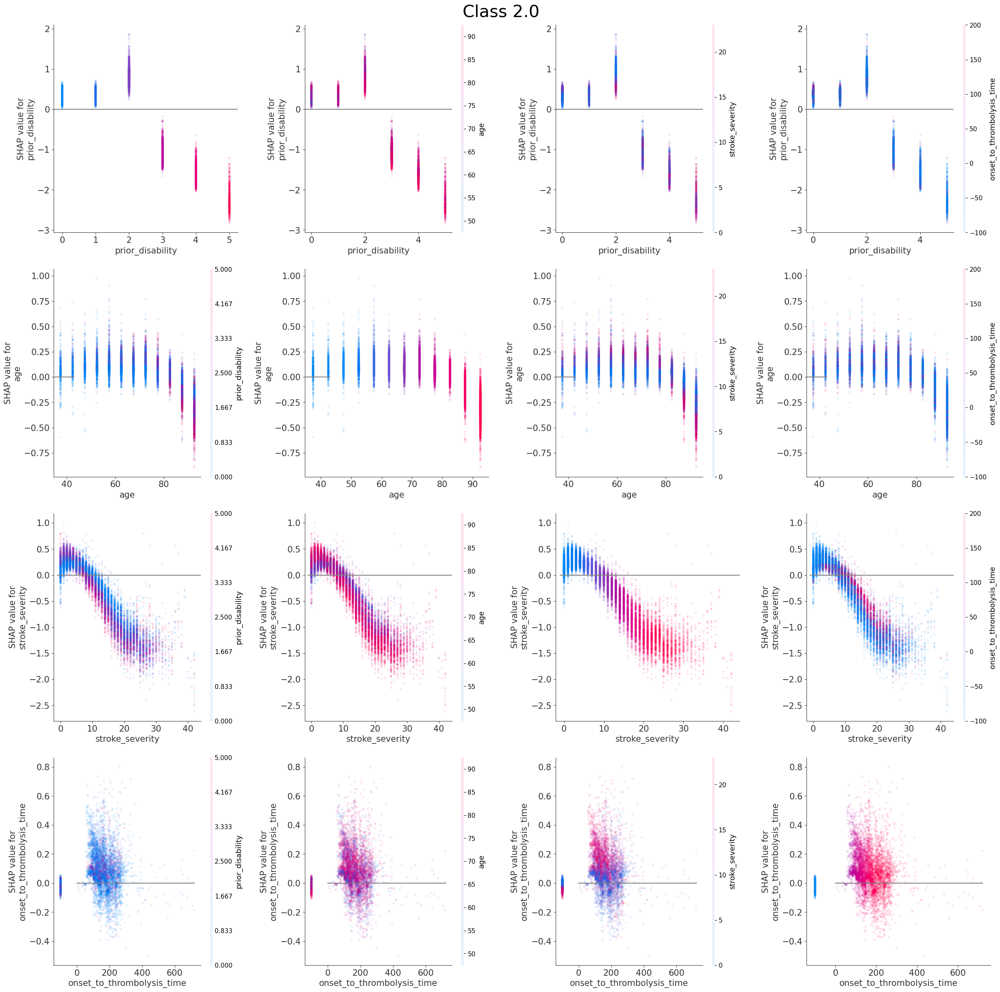

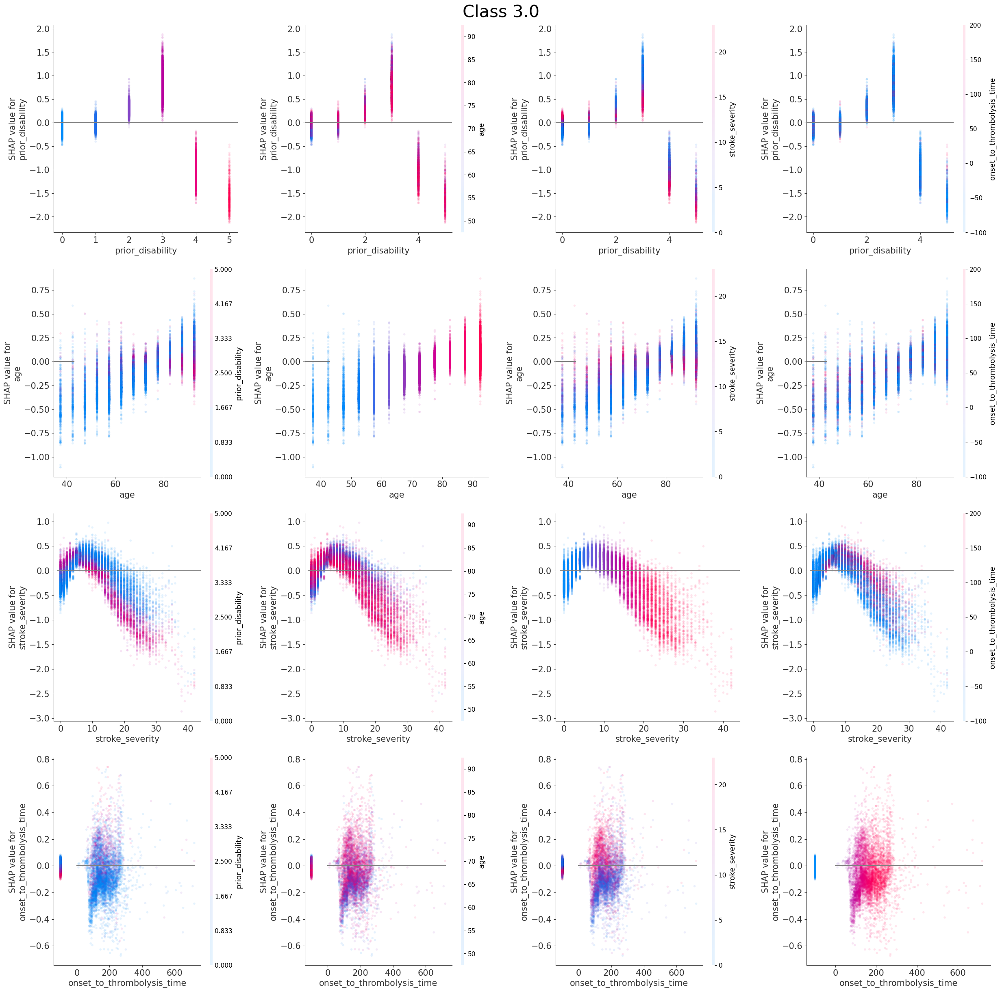

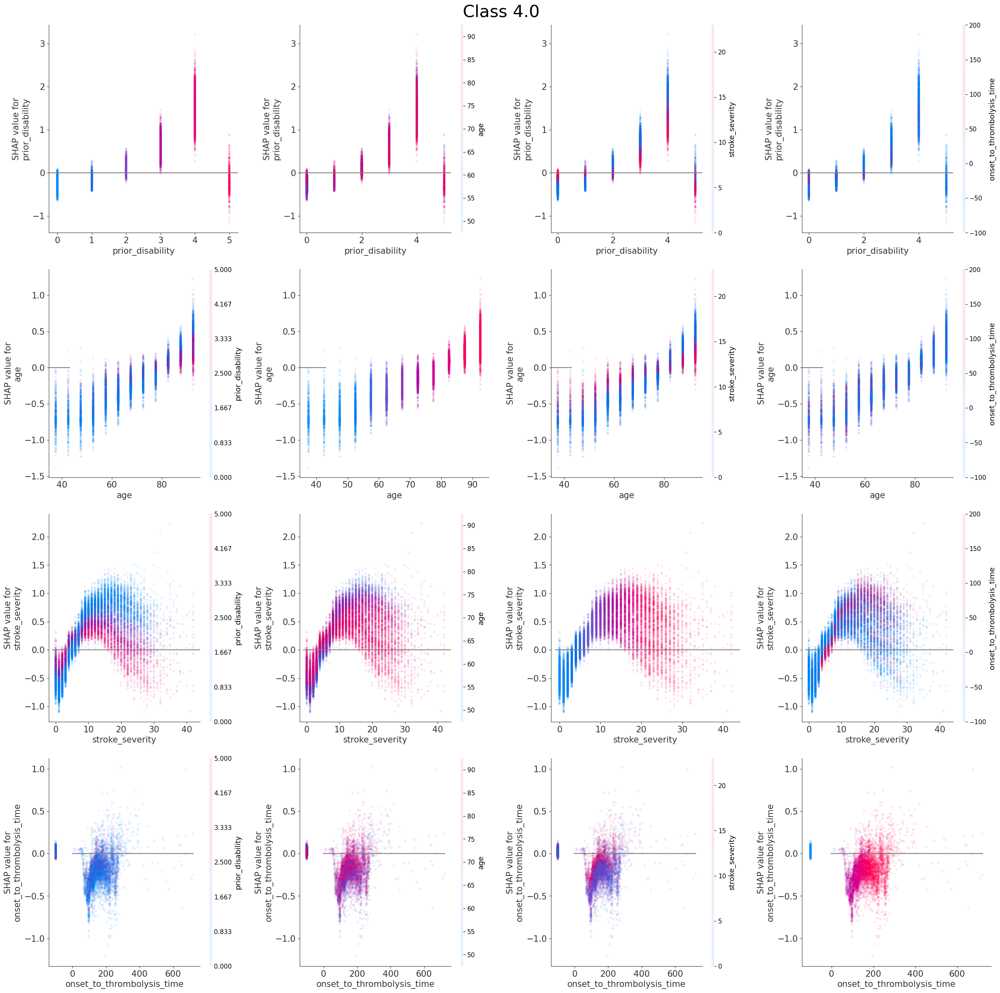

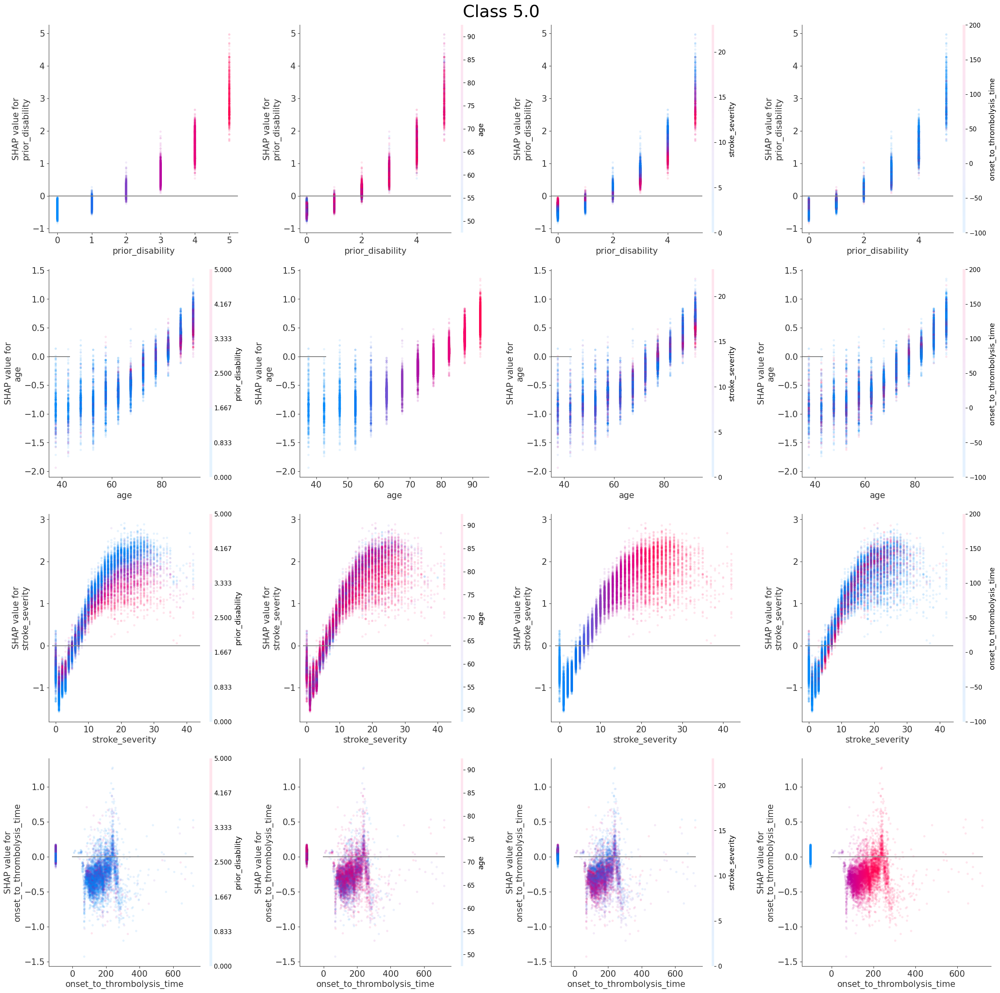

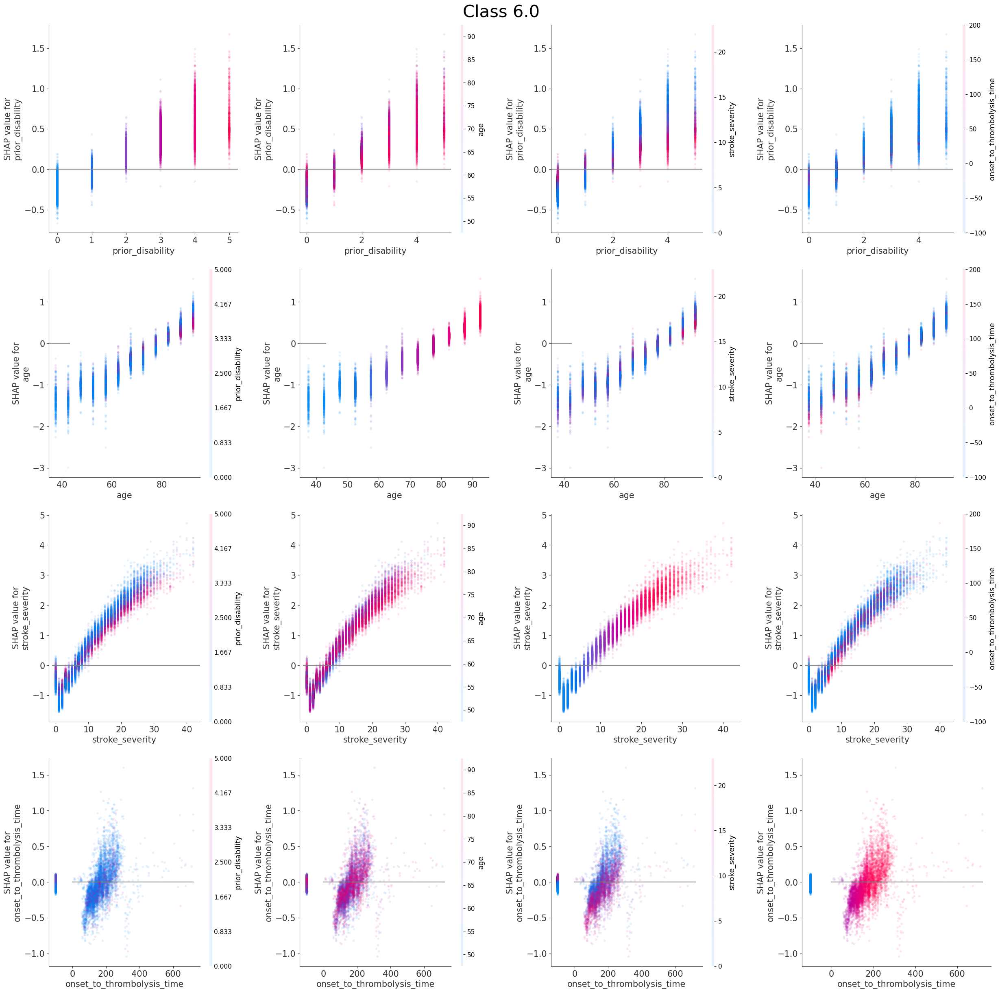

In [18]:
features_to_show = ["prior_disability", "age", "stroke_severity", 
                    "onset_to_thrombolysis_time"]

n_features_show = len(features_to_show)

# Create a matrix of subplots per class. Each showing the relationship between
# each combination of features on the SHAP value.
for c in range(n_classes):

    # setup matrix of subplots
    fig, axes = plt.subplots(nrows=n_features_show,
                             ncols=n_features_show)
    axes = axes.ravel()

    # Set overall title
    fig.suptitle(f'Class {model.classes_[c]}', fontsize=30)

    # Initialise subplot counter
    count = 0

    # Loop through the features to display
    for i in range(len(features_to_show)):
        # Loop through the features to display
        for j in range(len(features_to_show)):
            # Create the plot. Pass the axes
            shap.dependence_plot(ind=features_to_show[i], 
                                interaction_index=features_to_show[j], 
                                shap_values=shap_values[:,:,c], 
                                features=X_test.values, 
                                feature_names=X_test.columns,
                                show=False, ax=axes[count],
                                alpha=0.1)
            
            # Add line as shap=0
            axes[count].plot([-1, X_test[feature_names_ohe[i]].max()+1],
                             [0,0],c='0.5')
            
            # Increase subplot counter
            count+=1
    
    # Change font size for each subplot
    for ax in axes:
        ax.set_xlabel(ax.get_xlabel(), fontsize=15)
        ax.set_ylabel(ax.get_ylabel(), fontsize=15)
        ax.tick_params(axis='both',which='major',labelsize=15)

    # Visual properties of figure
    dimension = 5 * 5
    fig.set_figheight(dimension)
    fig.set_figwidth(dimension)
    fig.tight_layout(pad=2)
    plt.show()


We can also choose one of these feature combinations and focus on seeing how the patterns change across the classes (as to do this comparison from the above set of plots requires a lot of scrolling and memory of the patterns seen in the other classes)

Create a function to plot the dependence plot for a specific feature and interaction, showing a plot per class

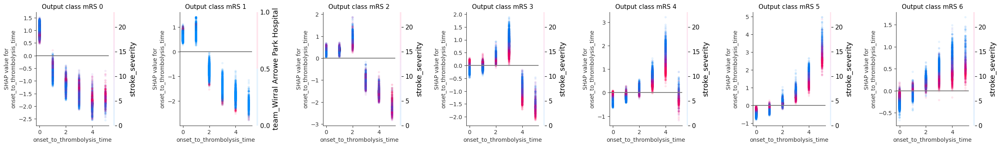

In [19]:
def create_set_of_dependence_plot_across_class(feature_to_show, 
                                               interaction_feature, k, 
                                               features, feature_names, 
                                               n_classes, shap_values):
    """
    
    Args:



    Return:
        None
    """

    # setup matrix of subplots
    fig, axes = plt.subplots(nrows=1, ncols=n_classes, figsize=(25,4))
    axes = axes.ravel()

    for c in range(n_classes):

        shap.dependence_plot(ind=feature_to_show, 
                            interaction_index=interaction_feature, 
                            shap_values=shap_values[:,:,c], 
                            features=features, 
                            feature_names=feature_names,
                            show=False, ax=axes[c],
                            alpha=0.1)

        # Change font size for each subplot
        axes[c].set_xlabel(axes[c].get_xlabel(), fontsize=10)
        axes[c].set_ylabel(axes[c].get_ylabel(), fontsize=10)
        axes[c].tick_params(axis='both',labelsize=10)
        axes[c].set_title(label=f"Output class mRS {c}", fontsize=11)
        axes[c].set_ylim()

        # Add line as shap=0
        axes[c].plot(axes[c].get_xlim(), [0,0], c='0.5')

    # Visual propoerties of figure
    fig.tight_layout(pad=2)
    fig.tight_layout(pad=2)

    plt.show()

    return()


In [ ]:
create_set_of_dependence_plot_across_class("onset_to_thrombolysis_time", 
                                           "stroke_severity", 0, X_test.values, 
                                           X_test.columns, n_classes, 
                                           shap_values)

In [ ]:
create_set_of_dependence_plot_across_class("age", 
                                           "prior_disability", 0, X_test.values, 
                                           X_test.columns, n_classes, 
                                           shap_values)

### View the global case: Beeswarm plot

A Beeswarm plot shows data for all of the test instances.

The feature value for each point is shown by the colour, and its position indicates the SHAP value for that instance.

Beeswarm plots are used to get a picture of how the feature value interacts with it's SHAP value by looking at the plots of a specific class and kfold.

Reminder: ```shap_values_kfold[kfold][instance, feature, class]```

To note: can be visualised as either dots or violin plots. Can see how there is a difference in the visualisation depending on this choice. For first kfold, for class mRS0 can see with dot represenation that for feature age, a high age gives a SHAP value in the range from negative to zero. Whereas the violin representation gives a high age a SHAP value a lower ranges (largest value is negative, does not reach 0)

See below for the first kfold, for all of the classes

In [ ]:
for c in range(len(class_names)):

    shap.summary_plot(shap_values[:,:,c], X_test.values, 
                    feature_names=X_test.columns, show=False, 
                    plot_size=(12,5), plot_type='violin')

    plt.title(f"Class {c}, K-fold {k+1}")
    plt.tight_layout()
    plt.show()

We can use violin plots to show the relationship between feature value and SHAP value for each of the features, for each target class.

We can also output descriptive text to use in documentations to describe the differences a feature value had on the likelihood of receiving thromboylsis.

Resource: https://towardsdatascience.com/binning-records-on-a-continuous-variable-with-pandas-cut-and-qcut-5d7c8e11d7b0 https://matplotlib.org/3.1.0/gallery/statistics/customized_violin.html

Create a function to style the axis

In [23]:
def set_ax(ax, category_list, feat, rotation=0):
    '''

    Args:
        ax [matplotlib axis object]: matplotlib axis object
        category_list [list]: used for the xtick labels (the grouping of the data)
        feat [string]: used in the axis label, the feature that is being plotted
        rotation [integer]: xtick label rotation

    Return
        ax [matplotlib axis object]:
    
    resource: 
    https://matplotlib.org/3.1.0/gallery/statistics/customized_violin.html
    '''
    # Set the axes ranges and axes labels
    ax.get_xaxis().set_tick_params(direction='out')
    ax.xaxis.set_ticks_position('bottom')
    ax.set_xticks(np.arange(1, len(category_list) + 1))
    ax.set_xticklabels(category_list, rotation=rotation, fontsize=7)
    ax.set_xlim(0.25, len(category_list) + 0.75)
    ax.set_ylabel(f'SHAP values for {feat}', fontsize=12)
    ax.set_xlabel(f'Feature values for {feat}', fontsize=12)
    return(ax)

Create a function to create a grid of violin plots

In [24]:
def create_grid_of_violin_plots(features_violin, 
                                class_category,
                                shap_values_extended
                                ):
    """
    Create a grid of violin plots (with each violin plot showing the 
    relationship between feature value and its SHAP value.

    Depending on the feature, there are some special cases for the plot layout.
   
    Args:
        features_violin [list]: list of features to create a violin plot
        class_category [integer]: the class to show
        shap_values_extended [shap_values variable]: shap values for a kfold
                (with three attributes: .values, .base_values and .data)
        
    Return:
        None
    
    """
    # Feature Age needs special consideration. It needs the x ticks to be created,
    # as the other features with over 50 unique values, but age is already grouped 
    # for the model (into 5yr groups) and so is treated as the other type.

    # Create figure
    fig = plt.figure(figsize=(12,14), constrained_layout=True)


    fig.suptitle(f'Model to predict discharge disability mRS = {class_category}', 
                 fontsize=20)

    # A subplot showing violin plot for each feature.
    # First prepare the fature data for the violin plot: if feature has more than 
    # 50 unique values then assume it needs to be binned (a violin for each bin)

    # Determine number of rows of subplots by rounding up
    ncols = 2
    nrows = math.ceil(len(features_violin)/ncols)

    # Through each feature
    for n, feat in enumerate(features_violin):    
        
        # Get data and SHAP values
        feature_data = shap_values_extended[:, feat, class_category].data
        feature_shap = shap_values_extended[:, feat, class_category].values

        # If feature has more that 50 unique values, then assume it needs to be 
        # binned (otherwise assume they are unique categories)

        if np.unique(feature_data).shape[0] > 50:
            # bin the data, create a violin per bin
            
            # settings for the plot
            rotation = 45
            step = 30
            n_bins = min(11, np.int((feature_data.max())/step))
            
            # create list of bin values
            bin_list = [(i*step) for i in range(n_bins)]
            bin_list.append(feature_data.max())
            if feat == "onset_to_thrombolysis_time":
                # for -100 for no IVT
                bin_list.insert(0, feature_data.min())

            # Number of instances per bin
            counts, edges = np.histogram(feature_data, bins=bin_list, density=False)

            # create list of bins (the unique categories)
            category_list = [f'{i*step}-{((i+1)*step-1)}\n[n={int(counts[i+1])}]' for i in range(n_bins-1)]
            category_list.append(f'{(n_bins-1)*step}+\n[n={int(counts[-1])}]')
            if feat == "onset_to_thrombolysis_time":
                # for -100 for no IVT
                category_list.insert(0, f'Not receive IVT\n[n={int(counts[0])}]')

            # bin the feature data
            feature_data = pd.cut(feature_data, bin_list, labels=category_list, 
                                right=False)

            # create a list, each entry contains the corresponsing SHAP value for that 
            # category (or bin). A violin will represent each list.    
            shap_per_category = []
            for category in category_list:
                mask = feature_data == category
                shap_per_category.append(feature_shap[mask])

        else:
            # create a violin per unique value
            
            # settings for the plot
            rotation = 90
            
            # create list of unique categories in the feature data
            category_list = np.unique(feature_data)

            # Age needs to keep its decimal value (midpoint between 5 yrs)
            if feat != 'age':
                category_list = [int(i) for i in category_list]

            # create a list, each entry contains the corresponsing SHAP value for that 
            # category (or bin). A violin will represent each list.    
            count = []
            shap_per_category = []
            for category in category_list:
                mask = feature_data == category
                shap_per_category.append(feature_shap[mask])
                count.append(mask.sum())

            if feat == 'age':
                # create text of x ticks
                category_list = [f'{int(i-2.5)}-{int(i+2.5)}' for i in category_list]

                # SSNAP dataset had oldest age category as 100-120 (not a 5 yr band as 
                #   the other ages). To accommodate this, if last age category is "110"
                #   then overwrite the label with the correct band (100-120), and not
                #   107-112 as the above code would create.
                if category_list[-1] == '107-112':
                    category_list[-1] = '100-120'
            if feat == 'stroke_severity':
                # not enough space of chart for 2 lines fo x tick labels
                category_list = [f'{category_list[i]} [n={count[i]}]' for i in range(len(category_list))]
            else:
                category_list = [f'{category_list[i]}\n[n={count[i]}]' for i in range(len(category_list))]

        # create violin plot
        ax = fig.add_subplot(nrows,ncols,n+1)

        ax.violinplot(shap_per_category, showmeans=True, widths=0.9, 
                      showextrema=False)

        # Add line at Shap = 0
        feature_values = shap_values_extended[:, feat].data
        ax.plot([0, len(feature_values)], [0,0],c='0.5')   

        # customise the axes
        ax = set_ax(ax, category_list, feat, rotation=rotation)
        plt.subplots_adjust(bottom=0.15, wspace=0.05)

        # Adjust stroke severity tickmarks
        if feat == 'Stroke severity':
            ax.set_xticks(np.arange(1, len(category_list)+1, 2))
            ax.set_xticklabels(category_list[0::2])   
            
        # Add title
        ax.set_title(feat)
        
    plt.tight_layout(pad=2)
        
    filename = os.path.join(paths.image_save_path, (paths.notebook + 
                            paths.model_text + 
                            '_thrombolysis_shap_violin_all_' +
                            f'features_for_mRS{class_category}.jpg'))
    fig.savefig(filename, 
                dpi=300, bbox_inches='tight', pad_inches=0.2)

    plt.show()
    return()

Show violin plots for the first kfold

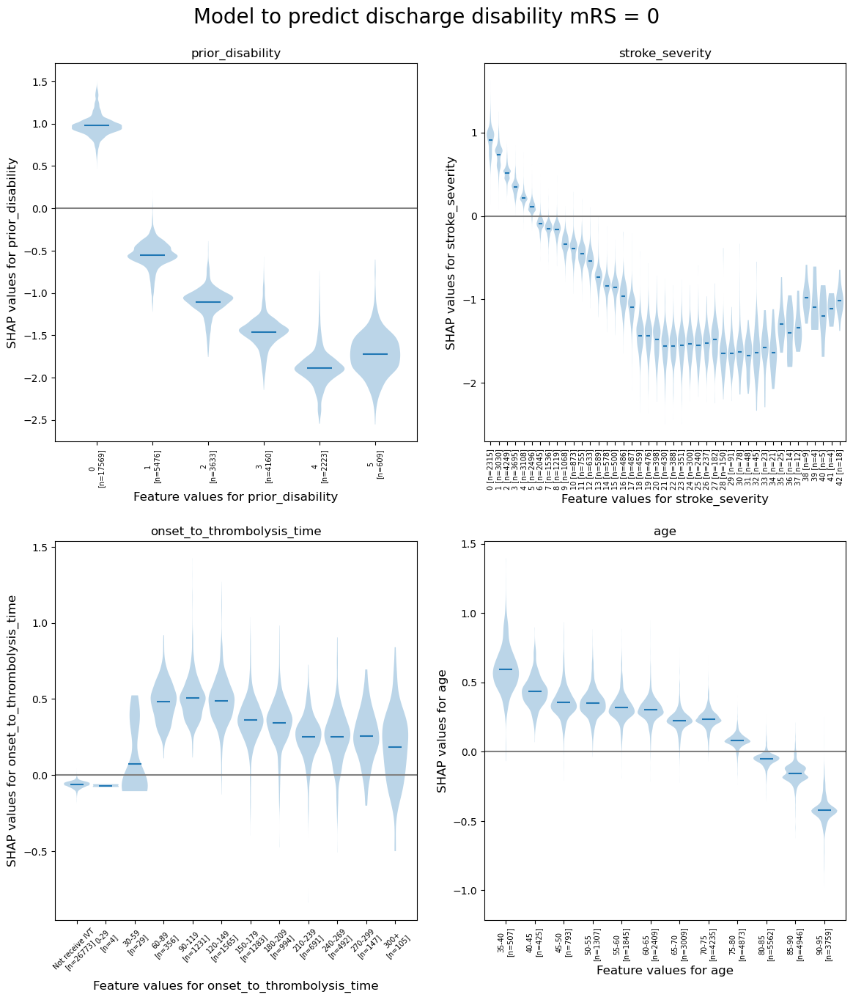

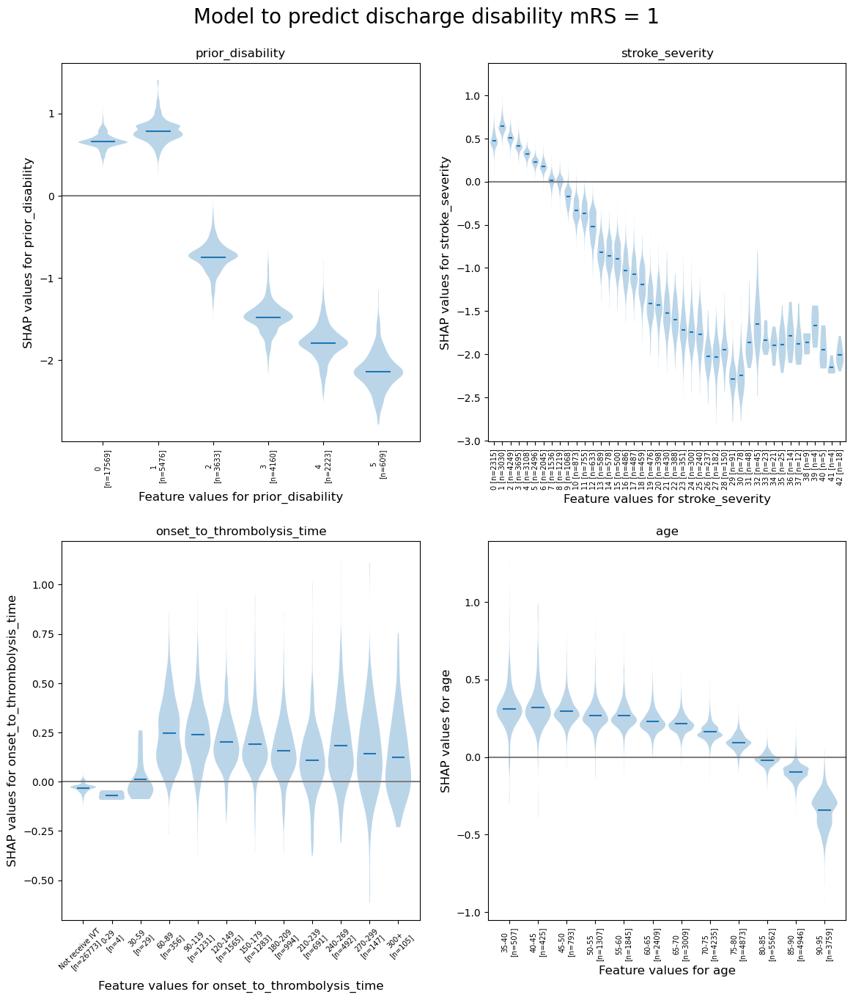

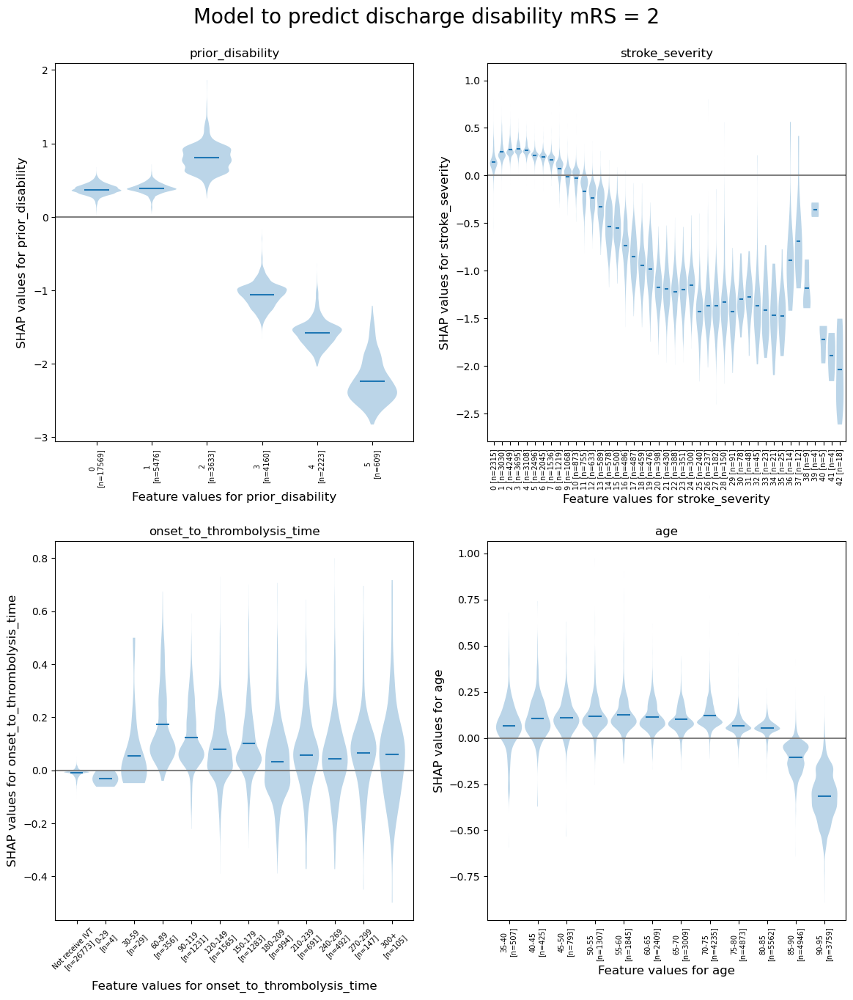

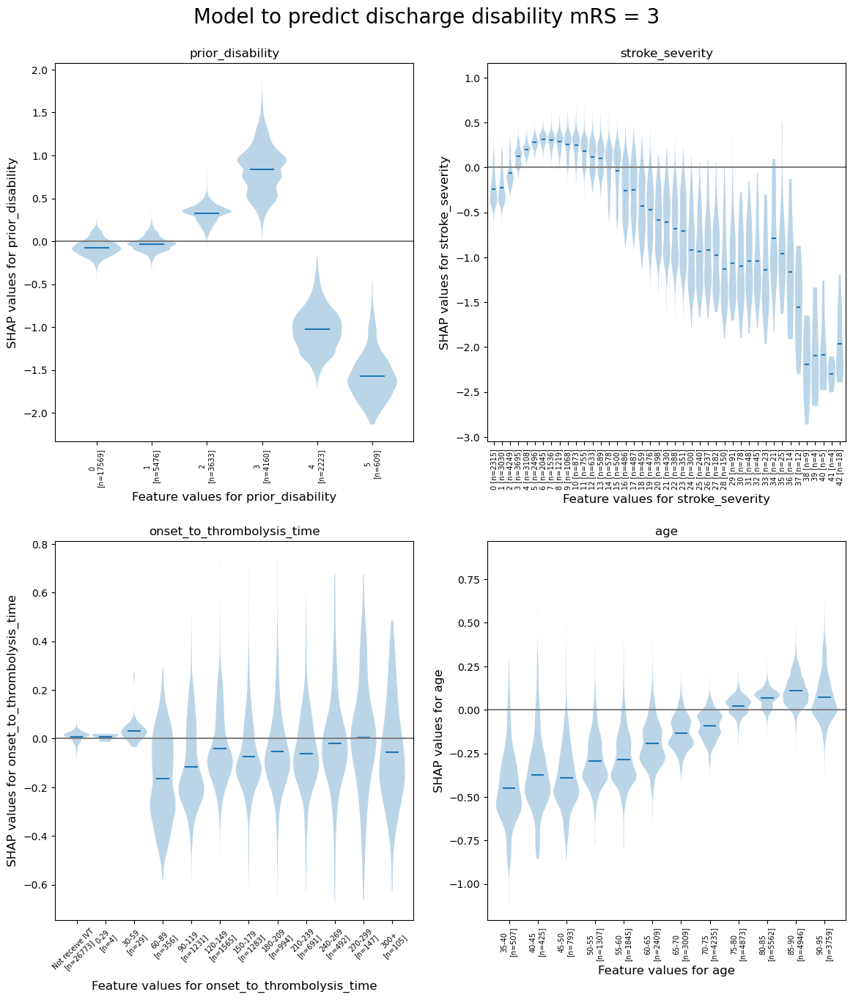

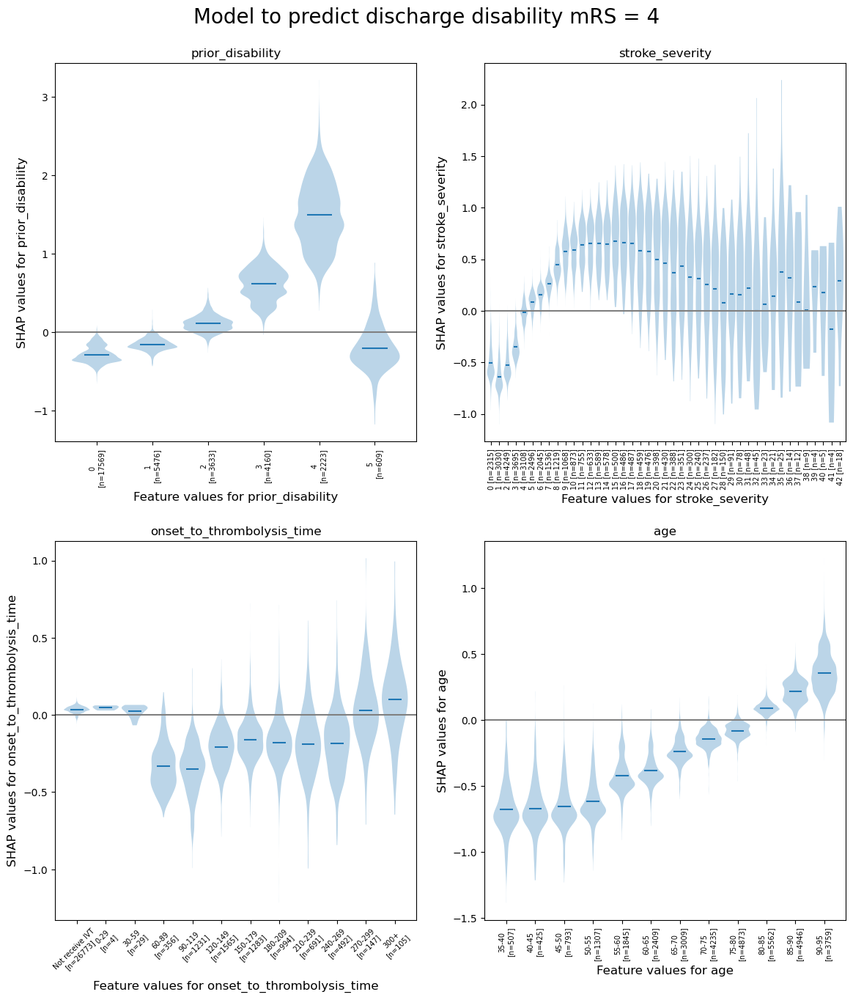

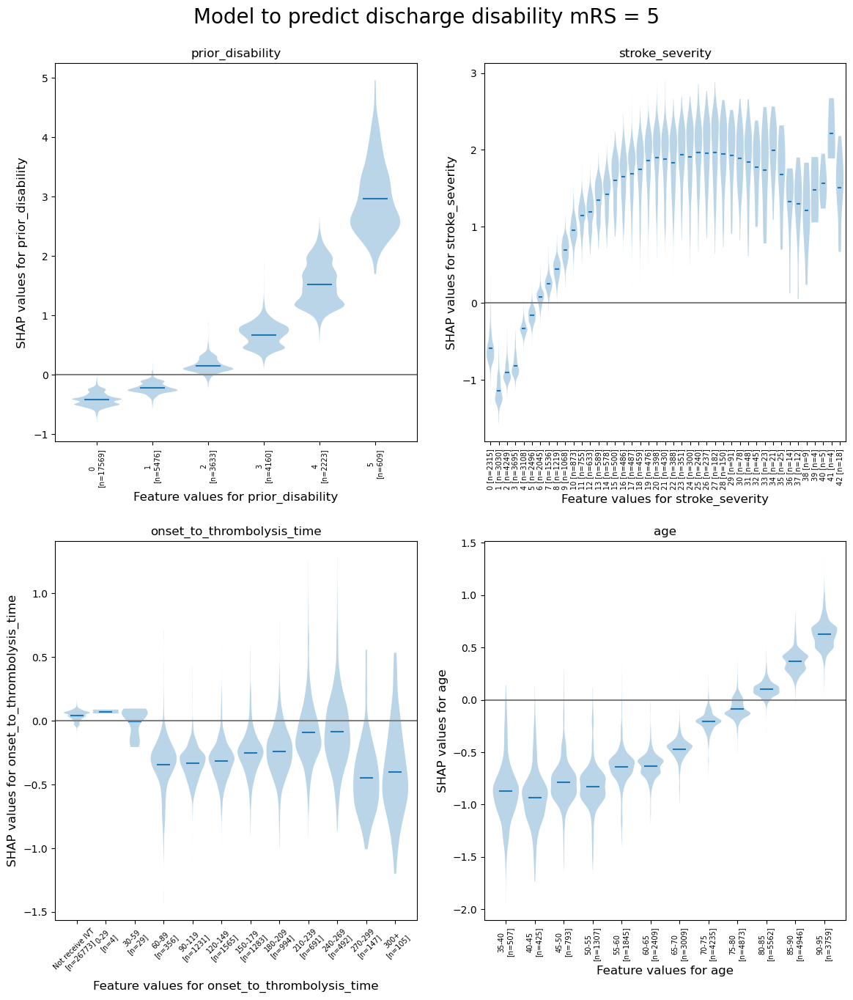

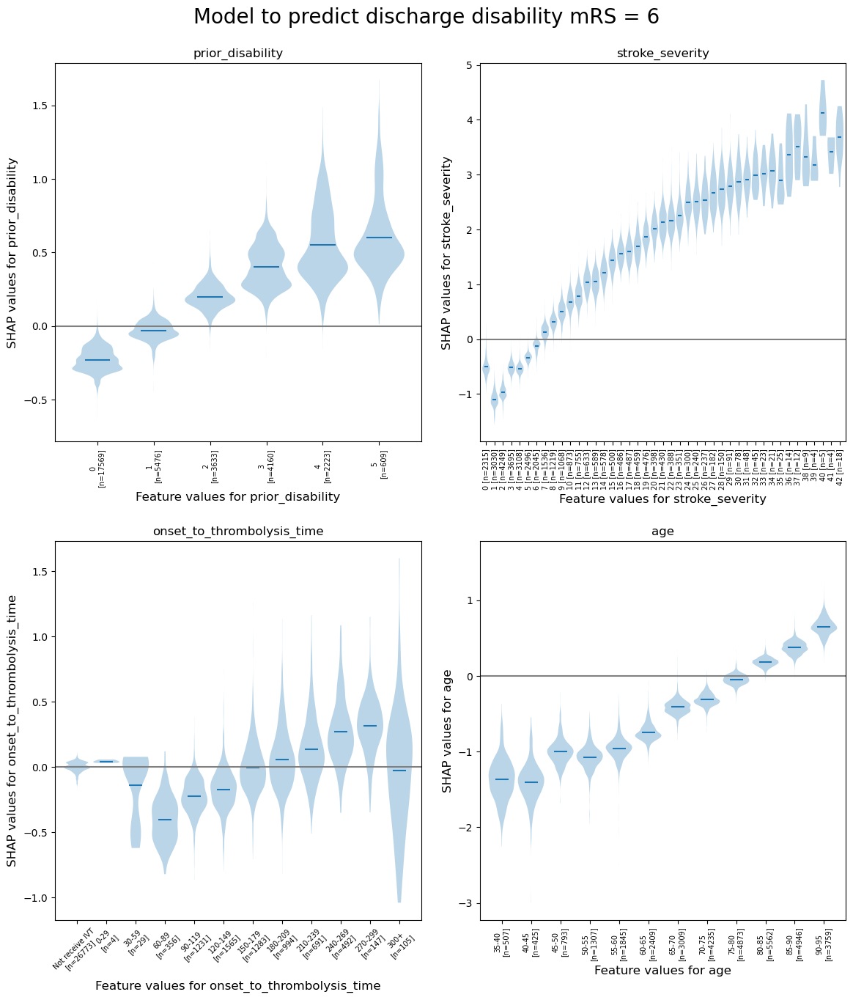

In [25]:
# Features to include in the violin plot grid
features_violin = ['prior_disability','stroke_severity',
                   'onset_to_thrombolysis_time','age']

for c in range(n_classes):
    create_grid_of_violin_plots(features_violin, 
                                c,
                                shap_values_extended)

Compare SHAP values for the hospital one-hot encoded features.

The hospital feature is one-hot encoded, so there is a SHAP value per stroke team. We will use this to create a histogram of the frequency of the SHAP value for the hospital feature (take the mean of the SHAP values for the instances for each hospital's own patients).

In [26]:
def create_histogram_data_and_plot(test_stroke_team,
                                   shap_values,
                                   features_ohe,
                                   class_category):
    """
    
    
    
    Args:
        test_stroke_team []:
        shap_values []:
        features_ohe []:
        class_category []:

    Return:
        None
    """

    # Set up list for storing patient data and hospital SHAP
    feature_data_with_shap = []

    # Get mean SHAP for stroke team when patient attending that stroke team
    unique_stroketeams_list = list(np.unique(test_stroke_team))
    stroke_team_mean_shap = []
    stroke_team_std_shap = []
    # Loop through stroke teams
    for stroke_team in unique_stroketeams_list:
        # Identify rows in test data that match each stroke team
        mask = test_stroke_team == stroke_team
        # Extract those rows, for the class
        stroke_team_shap_all_features = shap_values[mask,:]#shap_values[mask]
        # Get column index for stroke_team_in_shap
        feature_name = 'team_' + stroke_team
        index = features_ohe.index(feature_name)
        # Get SHAP values for hospital
        stroke_team_shap = stroke_team_shap_all_features[:, index]
        # Get mean of the absolute SHAPs
        mean_shap = np.mean(np.absolute(stroke_team_shap))
        # Store mean
        stroke_team_mean_shap.append(mean_shap)
        # Get std
        std_shap = np.std(stroke_team_shap)
        # Store std
        stroke_team_std_shap.append(std_shap)

        # Get and store feature data and add SHAP
        feature_data = pd.DataFrame(data=test_stroke_team[mask].values, 
                                    columns=["Hospital_name"])
        feature_data['Hospital_SHAP'] = stroke_team_shap
        feature_data_with_shap.append(feature_data)

    # Concatenate and save feature_data_with_shap
    feature_data_with_shap = pd.concat(feature_data_with_shap, axis=0)

    filename = os.path.join(paths.data_save_path, (paths.notebook + 
                            paths.model_text + 
                            f'_individual_data_of_hospital_attended_shap_for_'
                            f'mRS{class_category}.csv'))
    feature_data_with_shap.to_csv(filename, index=False)

    # Create and save shap mean value per hospital
    hospital_data = pd.DataFrame()
    hospital_data["stroke_team"] = unique_stroketeams_list
    hospital_data["mean_abs_shap"] = stroke_team_mean_shap
    hospital_data["std_shap"] = stroke_team_std_shap
    filename = os.path.join(paths.data_save_path, (paths.notebook + 
                            paths.model_text + 
                            f'_meanabs_std_shap_per_hospital_for_mRS{class_category}'
                            f'.csv'))
    hospital_data.to_csv(filename, index=False)

    # Plot histogram of the frequency of the mean SHAP value for the instances for each hospital's own patients
    # Use from violin plots
    fig = plt.figure(figsize=(12,3))
    ax = fig.add_subplot()

    ax.hist(stroke_team_mean_shap, bins=np.arange(-1.5, 1.5, 0.1), 
            color=[0.12156863, 0.46666667, 0.70588235, 0.3], 
            ec=[0.12156863, 0.46666667, 0.70588235, 1.], 
            linewidth=1.4)
    ax.set_title(f"Outcome for class {class_category}")
    ax.set_xlabel('SHAP values (mean of the absolutes) for hospital attended')
    ax.set_ylabel('Count')
    filename = os.path.join(paths.image_save_path, (paths.notebook + 
                            paths.model_text + 
                            '_hosp_shap_hist.jpg'))
        
    plt.savefig(filename, dpi=300, 
                bbox_inches='tight', pad_inches=0.2)
    plt.show()

    return()

For the first kfold, produce the histograms of the frequency of the hospital one hot encoded shap value, the attended hospital - a plot per target class.

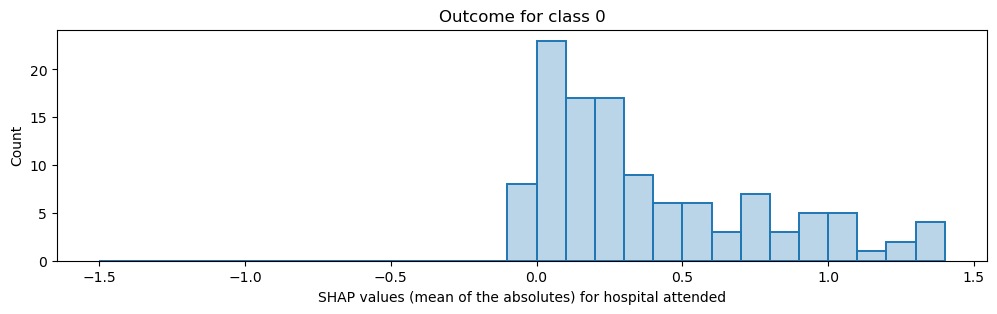

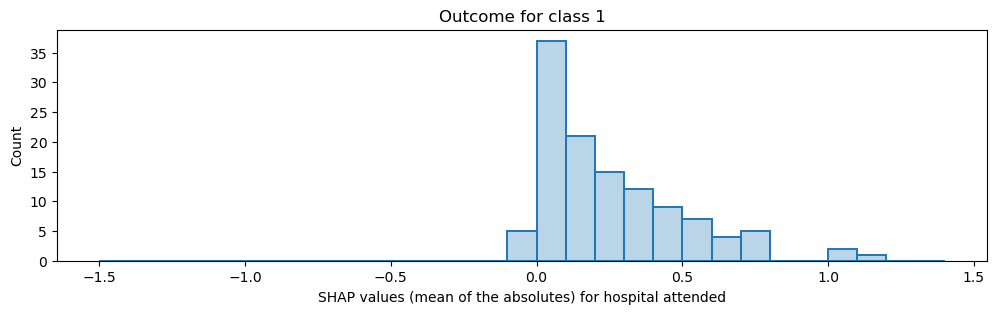

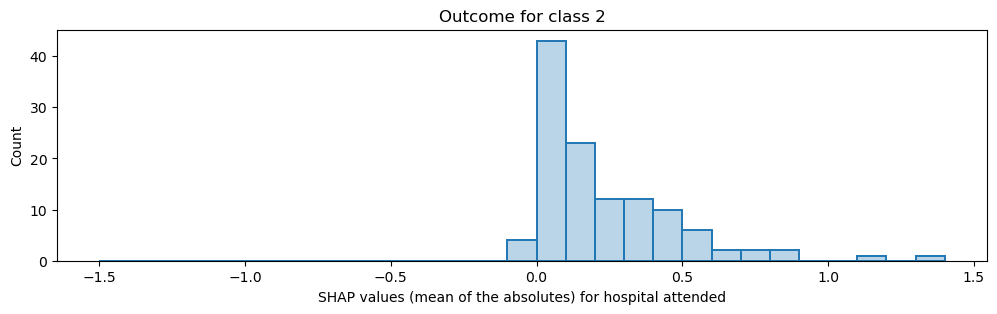

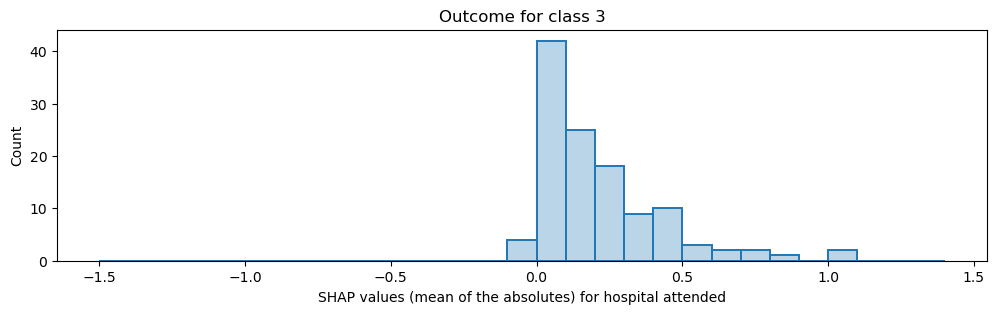

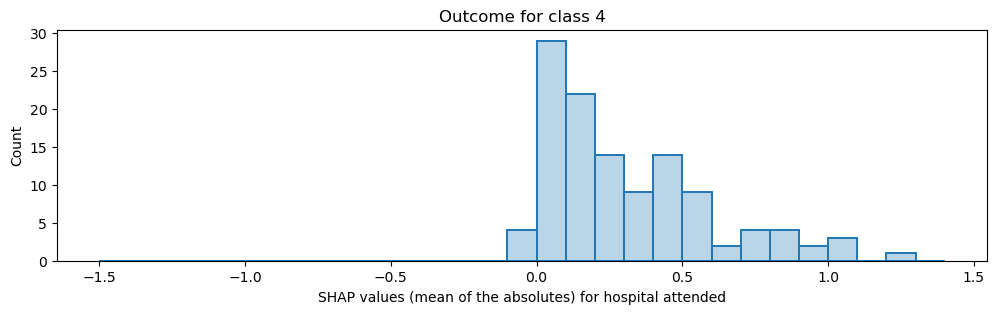

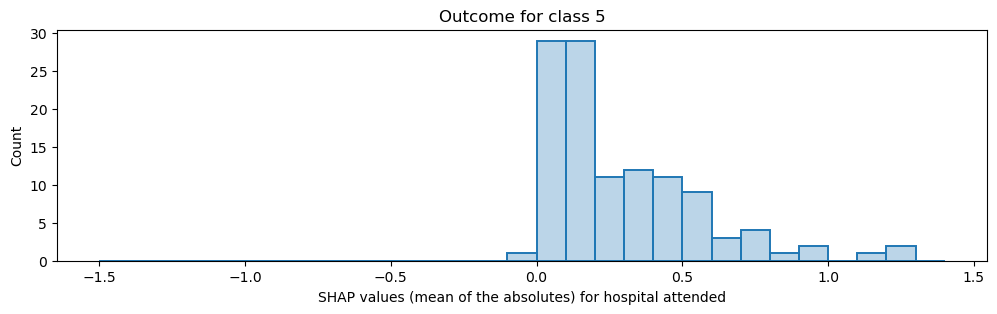

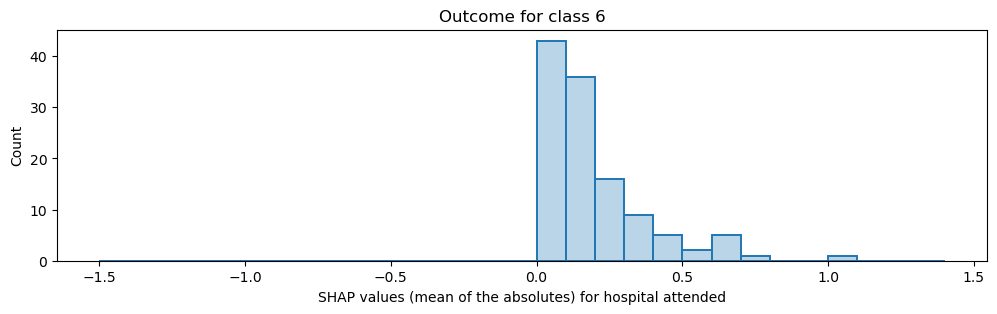

In [27]:
for c in range(n_classes):
    create_histogram_data_and_plot(test_stroke_team,
                                   shap_values[:,:,c],
                                   feature_names_ohe,
                                   c)

Show the relationship between feature value and SHAP value for the top 6 influential features (as SHAP plots scatter), for the first kfold.

Identify the 6 features that contribute to the prediction (across the 5 kfolds)

In [ ]:
# Initialise empty list
shap_values_mean_kfold = []

# For each k-fold split
for k in range(5):
    # Calculate mean SHAP value for each feature (across all instances)
    shap_values = shap_values_kfold[k][:,:,c]
    df = pd.DataFrame(index=feature_names_ohe)
    df['mean_shap'] = np.mean(shap_values, axis=0)
    df['abs_mean_shap'] = np.abs(df['mean_shap'])
    df['mean_abs_shap'] = np.mean(np.abs(shap_values), axis=0)
    df['rank'] = df['mean_abs_shap'].rank(
        ascending=False).values
    df.sort_index()
    # Store in a list (a dataframe per kfold)
    shap_values_mean_kfold.append(df)

# Initialise DataFrame 
# (stores mean of the absolute SHAP values for each kfold)
df_mean_abs_shap = pd.DataFrame()

# For each k-fold split
for k in range(5):
    # mean of the absolute SHAP values for each k-fold split
    df_mean_abs_shap[f'{k}'] = shap_values_mean_kfold[k]['mean_abs_shap']
    
# Create a dataframe that stores the min, median, and max SHAP values for 
# each feature across the 5 k-fold splits
df_mean_abs_shap_summary = pd.DataFrame()
df_mean_abs_shap_summary['min'] = df_mean_abs_shap.min(axis=1)
df_mean_abs_shap_summary['median'] = df_mean_abs_shap.median(axis=1) 
df_mean_abs_shap_summary['max'] = df_mean_abs_shap.max(axis=1)
df_mean_abs_shap_summary.sort_values('median', inplace=True, ascending=False)

# Identify the features that contribute thos most to the prediction
features_ranked_by_shap = list(df_mean_abs_shap_summary.index)
feat_to_show = features_ranked_by_shap[0:6]

Other resources: https://towardsdatascience.com/how-to-easily-customize-shap-plots-in-python-fdff9c0483f2

Show for the first kfold.

In [ ]:
# Create a set of subplots per target class
for c in range(len(class_names)):

    fig = plt.figure(figsize=(12,9))
    fig.suptitle(f"Target class: mRS{c}")
    for n, feat in enumerate(feat_to_show):    
        ax = fig.add_subplot(2,3,n+1)
        shap.plots.scatter(shap_values_extended[:, feat], x_jitter=0, ax=ax, 
                           show=False)
        
        # Add line at Shap = 0
        ax.plot([ax.get_xlim()[0], ax.get_xlim()[1]], [0,0], c='0.5')    
        
        ax.set_ylabel(f'SHAP value (log odds) for\n{feat}')
        ax.set_title(feat)
        
        # Censor arrival to scan to 1200 minutes
        if feat == 'Arrival-to-scan time':
            ax.set_xlim(0,1200)
        
    plt.tight_layout(pad=2)

    filename = os.path.join(paths.image_save_path, (paths.notebook + 
                            paths.model_text + 
                            f'_thrombolysis_shap_scatter_class{c}.jpg'))

    fig.savefig(filename, dpi=300, bbox_inches='tight', pad_inches=0.2)

    plt.show()

Duration to run notebook

In [ ]:
str(datetime.timedelta(seconds=(time.time()-start_time)))

For use in other notebooks, which hospital has a SHAP value that is closest to zero for all of the output classes, for this kfold?

None of the hospitals has a zero SHAP in each of the classes.

In [28]:
list_hospital_zero_mean_std = []
for c in range(n_classes):

    filename = os.path.join(paths.data_save_path, (paths.notebook + 
                            paths.model_text + 
                            f'_meanabs_std_shap_per_hospital_for_mRS{c}'
                            f'.csv'))
    
    hospital_data = pd.read_csv(filename)

    filtered_values = np.where((hospital_data["mean_abs_shap"]==0) & (hospital_data["std_shap"]==0))
    list_hospital_zero_mean_std.append(list(hospital_data["stroke_team"].loc[filtered_values].values))

[['Bronglais Hospital',
  'Countess of Chester Hospital',
  'Royal Derby Hospital',
  "St Mary's Hospital Newport",
  'St Richards Hospital',
  'University Hospitals Dorset Stroke Service',
  'Weston General Hospital',
  'Wycombe General Hospital'],
 ['Bradford and Airedale SU',
  'Queen Elizabeth the Queen Mother Hospital',
  'Royal United Hospital Bath',
  'Warwick Hospital',
  'Wycombe General Hospital'],
 ['Broomfield Hospital',
  'James Paget Hospital',
  "King's College Hospital HASU",
  "St Mary's Hospital Newport"],
 ['Cumberland Infirmary',
  'Luton and Dunstable Hospital',
  'Milton Keynes General Hospital',
  'Weston General Hospital'],
 ["Addenbrooke's Hospital",
  'Furness General Hospital',
  'Royal Lancaster Infirmary',
  'Weston General Hospital'],
 ['Ysbyty Gwynedd'],
 []]

Return the number of times each hospital has zero SHAP mean and std deviation for the classes, for the first kfold

In [29]:
from collections import Counter
flatten = [item for row in list_hospital_zero_mean_std for item in row]
Counter(flatten).most_common(20)

[('Weston General Hospital', 3),
 ("St Mary's Hospital Newport", 2),
 ('Wycombe General Hospital', 2),
 ('Bronglais Hospital', 1),
 ('Countess of Chester Hospital', 1),
 ('Royal Derby Hospital', 1),
 ('St Richards Hospital', 1),
 ('University Hospitals Dorset Stroke Service', 1),
 ('Bradford and Airedale SU', 1),
 ('Queen Elizabeth the Queen Mother Hospital', 1),
 ('Royal United Hospital Bath', 1),
 ('Warwick Hospital', 1),
 ('Broomfield Hospital', 1),
 ('James Paget Hospital', 1),
 ("King's College Hospital HASU", 1),
 ('Cumberland Infirmary', 1),
 ('Luton and Dunstable Hospital', 1),
 ('Milton Keynes General Hospital', 1),
 ("Addenbrooke's Hospital", 1),
 ('Furness General Hospital', 1)]

No hospital has a zero SHAP for all classes.

Instead, for each hospital, take the maximum of the mean of the absolute SHAPS, from the 6 target classes.

Then return the hospitals ranked with the smallest maximum mean of the absolute SHAP values (across the classes).

Select the hospital that has the smallest value.

In [30]:
hospital_shap_mean_all_classes=pd.DataFrame()
hospital_shap_std_all_classes=pd.DataFrame()
for c in range(n_classes):

    filename = os.path.join(paths.data_save_path, (paths.notebook + 
                            paths.model_text + 
                            f'_meanabs_std_shap_per_hospital_for_mRS{c}'
                            f'.csv'))
    
    hospital_data = pd.read_csv(filename)

    hospital_shap_mean_all_classes[f"mean_abs_shap_class{c}"] = hospital_data["mean_abs_shap"]
    hospital_shap_std_all_classes[f"std_shap_class{c}"] = hospital_data["std_shap"]
hospital_shap_mean_all_classes.set_index(hospital_data["stroke_team"].values, inplace=True)
hospital_shap_std_all_classes.set_index(hospital_data["stroke_team"].values, inplace=True)

df_results = pd.DataFrame()
df_results["max_of_the_absolute_mean_shap"] = np.absolute(hospital_shap_mean_all_classes).max(axis=1)
df_results.set_index(hospital_shap_std_all_classes.index, inplace=True)
df_results.sort_values(by=["max_of_the_absolute_mean_shap"], key=abs, inplace=True)
df_results

,max_of_the_absolute_mean_shap
Royal Lancaster Infirmary,0.175634
Royal Blackburn Hospital,0.196667
Bradford and Airedale SU,0.207011
Northampton General Hospital,0.210606
Stepping Hill Hospital,0.219814
...,...
University Hospital Coventry,1.429716
Royal Stoke University Hospital,1.540707
Prince Charles Hospital,1.936970
Royal London Hospital HASU,2.092946


View the individual SHAP values across the seven target classes for this chosen hospital

In [31]:
hospital_shap_mean_all_classes.loc["Royal Lancaster Infirmary"]

mean_abs_shap_class0    0.030435
mean_abs_shap_class1    0.105482
mean_abs_shap_class2    0.016508
mean_abs_shap_class3    0.074552
mean_abs_shap_class4    0.000000
mean_abs_shap_class5    0.175634
mean_abs_shap_class6    0.044300
Name: Royal Lancaster Infirmary, dtype: float64

Duration to run notebook

In [ ]:

str(datetime.timedelta(seconds=(time.time()-start_time)))